In [1]:
import os

experiment_path = './data/Error Experiment #2'

if not os.path.exists(experiment_path):
    os.makedirs(experiment_path)

In [2]:
from map_maker import cluttered_map, save_map
from Turtlebot_Kinematics import *
from environment import Environment, load_ENV
from Runner import ControllMode, Runner
from pso_controller import Multi_PSO_Controller
from dwa_controller import DWA_Controller

def set_errors(env:Environment, error_string:str):
    env.use_errors = True
    if error_string == "normal":
        pass
    elif error_string == "speed":
        env.deg_error = 0
        env.position_error = 0
        env.sensor_error = 0
    elif error_string == "position":
        env.speed_error = 0
        env.sensor_error = 0
    elif error_string == "sensor":
        env.speed_error = 0
        env.deg_error = 0
        env.position_error = 0

error_strings = ["normal", "speed", "position", "sensor"]

run_num = 31
dt = 0.1
max_index = None

# map parameters
map_obs = 8
map_size = 50
map_unknown = True
map_name = f"cluttered_{map_obs}obs_{map_size}x{map_size}_{'unknown' if map_unknown else 'known'}"

for i in range(12, run_num):
    # create run foder
    run_path = f"{experiment_path}/{i}"
    if not os.path.exists(run_path):
        os.makedirs(run_path)
    for err in error_strings:  
        # create run foder
        run_path = f"{experiment_path}/{i}/{err}"
        if not os.path.exists(run_path):
            os.makedirs(run_path)

        # create and save map
        run_map = cluttered_map(map_obs, map_size, map_unknown)
        map_path = f"{run_path}/{map_name}"
        save_map(run_map, map_name, run_path)

        # run and save long MultiPSO data
        kinematic = unicycleKin()
        long_MultiPSO_ENV = Environment.from_dict(run_map, kinematic, record=True)
        set_errors(long_MultiPSO_ENV, err)
        long_MultiPSO_controller = Multi_PSO_Controller(5, kinematic, 10, 0.75, 10)
        if max_index is None:
            max_index = long_MultiPSO_ENV.goal_travel_time / dt + 200
        else: max_index = max(max_index, long_MultiPSO_ENV.goal_travel_time / dt + 200)
        long_MultiPSO_Runner = Runner(
            long_MultiPSO_ENV, 
            ControllMode.MultiPSO, 
            long_MultiPSO_controller, 
            max_step = max_index,
            dt = dt,
            save_path= f"{run_path}/long_MultiPSO_data"
        )
        long_MultiPSO_Runner.loop()

        # run and save short MultiPSO data
        short_MultiPSO_ENV = Environment.from_dict(run_map, kinematic, record=True)
        set_errors(short_MultiPSO_ENV, err)
        short_MultiPSO_controller = Multi_PSO_Controller(10, kinematic, 5, 1.5, 10)
        if max_index is None:
            max_index = short_MultiPSO_ENV.goal_travel_time / dt + 200
        else: max_index = max(max_index, short_MultiPSO_ENV.goal_travel_time / dt + 200)
        short_MultiPSO_Runner = Runner(
            short_MultiPSO_ENV, 
            ControllMode.MultiPSO, 
            short_MultiPSO_controller, 
            max_step = max_index,
            dt = dt,
            save_path= f"{run_path}/short_MultiPSO_data"
        )
        short_MultiPSO_Runner.loop()

        # run and save DWA data
        DWA_ENV = Environment.from_dict(run_map, kinematic, record=True)
        set_errors(DWA_ENV, err)
        DWA_controller = DWA_Controller(20, kinematic, virtual_dt=2.0)
        DWA_controller.heading_koeff = 30
        DWA_controller.speed_koeff = 30
        DWA_Runner = Runner(
            DWA_ENV, 
            ControllMode.DWA, 
            DWA_controller, 
            max_step = max_index,
            dt = dt,
            save_path= f"{run_path}/DWA_data"
        )
        DWA_Runner.loop()


pygame 2.5.2 (SDL 2.28.3, Python 3.10.11)
Hello from the pygame community. https://www.pygame.org/contribute.html
# 1
stepping (15.0, 0.5356955291734491)
changing offset
offset [ 0.58909925 -2.40882275 -0.02811164]
# 2
stepping (15.0, 0.4749347977067417)
changing offset
offset [ 8.27315979e+00 -6.59235786e-01 -4.50932440e-03]
# 3
stepping (14.987770581664808, -0.4054885551266294)
changing offset
offset [-3.42153889  5.44542358  0.0590139 ]
# 4
stepping (14.885604622978263, 0.42928098451421715)
changing offset
offset [ 7.31261509 -6.73753474  0.10171386]
# 5
stepping (14.4263713797149, -0.3648358167285564)
changing offset
offset [ 1.03254076 -2.86396729  0.04877336]
# 6
stepping (14.158294317533159, -0.01102383811429325)
changing offset
offset [6.67402675 8.92800617 0.01138249]
# 7
stepping (11.634570905767443, -0.03425490765399963)
changing offset
offset [ 0.5836332  -0.31238356  0.04786503]
# 8
stepping (12.060835298013588, -0.0499559639234499)
changing offset
offset [-6.49625367e-01 

In [3]:
import numpy as np

max_index = int(np.ceil(max_index))
print("Max_index:", max_index)


Max_index: 567


In [4]:
import pandas
from pandas import DataFrame
import matplotlib.pyplot as plt

In [5]:
def fill_df(df, length, di):
    index = df.index[-1]
    last_loc = df.iloc[-1]
    while len(df) < length:
        index += di
        df.loc[index] = last_loc
    return df

def build_loc(goal_dists, obst_dists):
    return {
        "goal_dists": goal_dists,
        "obst_dists": obst_dists
    }

In [6]:
err_frame_dict = {}
for err in error_strings:
    err_frame_dict[err] = (
        DataFrame(columns=["goal_dists", "obst_dists"]), #long
        DataFrame(columns=["goal_dists", "obst_dists"]), #short
        DataFrame(columns=["goal_dists", "obst_dists"])  #DWA
    )

def append_to_total_df(total_df, file_name, max_index, dt):
    df = pandas.read_hdf(file_name)
    goal_dists = fill_df(df["goal_dist"], max_index, dt)
    obst_dists = fill_df(df["obst_dist"], max_index, dt)
    total_df.loc[i] = build_loc(goal_dists, obst_dists)

for i in range(run_num):
    for err in error_strings:
        long_Multi_PSO_df, short_Multi_PSO_df, DWA_df = err_frame_dict[err]
        append_to_total_df(long_Multi_PSO_df, f"{experiment_path}/{i}/{err}/long_MultiPSO_data.h5", max_index, dt)
        append_to_total_df(short_Multi_PSO_df, f"{experiment_path}/{i}/{err}/short_MultiPSO_data.h5", max_index, dt)
        append_to_total_df(DWA_df, f"{experiment_path}/{i}/{err}/DWA_data.h5", max_index, dt)
    



In [7]:
def get_eval_arrays(total_df, max_index):
    print(total_df.iloc[0])
    avg_goal = list([np.average([total_df.iloc[i]["goal_dists"].iloc[j] for i in range(run_num)])for j in range(max_index)])
    avg_obst = list([np.average([total_df.iloc[i]["obst_dists"].iloc[j] for i in range(run_num)])for j in range(max_index)])
    min_obst = list([np.min([total_df.iloc[i]["obst_dists"].iloc[j] for i in range(run_num)])for j in range(max_index)])
    return avg_goal, avg_obst, min_obst


goal_dists    0.0      0.000000
0.1      0.081657
0.2      0...
obst_dists    0.0     3.125000
0.1     3.114717
0.2     3.29...
Name: 0, dtype: object
goal_dists    0.0      0.000000
0.1      0.110058
0.2      0...
obst_dists    0.0     3.125000
0.1     3.087431
0.2     3.22...
Name: 0, dtype: object
goal_dists    0.0      0.000000
0.1      0.137814
0.2      0...
obst_dists    0.0     3.125000
0.1     3.097092
0.2     3.15...
Name: 0, dtype: object
goal_dists    0.0       0.000000
0.1       0.038473
0.2     ...
obst_dists    0.0     3.125000
0.1     3.208814
0.2     3.30...
Name: 0, dtype: object
goal_dists    0.0       0.000000
0.1       0.375148
0.2     ...
obst_dists    0.0     3.125000
0.1     3.186815
0.2     3.28...
Name: 0, dtype: object
goal_dists    0.0       0.000000
0.1       0.085802
0.2     ...
obst_dists    0.0     3.125000
0.1     3.215585
0.2     3.31...
Name: 0, dtype: object
goal_dists    0.0     0.000000
0.1     0.137448
0.2     0.27...
obst_dists    0.0     3.125000

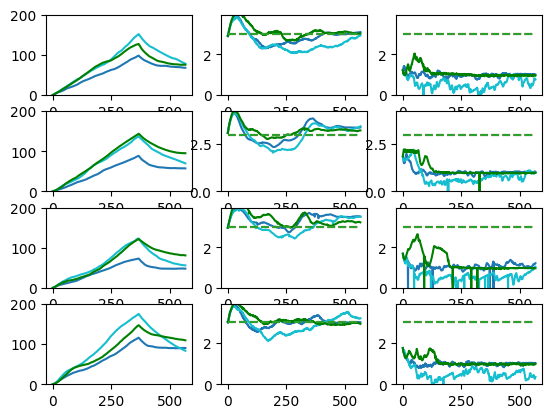

In [8]:
def plot_eval_row(axs, total_df, color="blue"):
    avg_goal, avg_obst, min_obst = get_eval_arrays(total_df, max_index)
    axs[0].plot(avg_goal, color=color)
    axs[0].set_ylim(top = 200)
    axs[1].plot(avg_obst, color=color)
    axs[1].plot([3]*len(avg_obst), linestyle="--")
    axs[2].plot(min_obst, color=color) 
    axs[2].plot([3]*len(min_obst), linestyle="--")
    axs[2].set_ylim(top = axs[1].get_ylim()[1])
    for ax in axs:
        ax.set_ylim(bottom = 0.0)

fig, axs = plt.subplots(len(error_strings),3)
for err, ax_row in zip(error_strings, axs):
    long_Multi_PSO_df, short_Multi_PSO_df, DWA_df = err_frame_dict[err]
    plot_eval_row(ax_row, long_Multi_PSO_df, "tab:blue")
    plot_eval_row(ax_row, short_Multi_PSO_df, "tab:cyan")
    plot_eval_row(ax_row, DWA_df, "green")


In [9]:
df = pandas.read_hdf("data\Map Experiment #2\9\DWA_data.h5")
print(df)
max_index

          robo_x      robo_y  robo_deg      goal_x  goal_y   goal_dist  \
0.0    50.000000  300.000000  0.000000   50.000000   300.0    0.000000   
0.1    51.542745  299.996242 -0.004872   51.363636   300.0    0.179148   
0.2    53.018691  299.999993 -0.009533   52.727273   300.0    0.291418   
0.3    54.449510  300.010400 -0.014051   54.090909   300.0    0.358752   
0.4    55.960577  300.028028 -0.018823   55.454545   300.0    0.506807   
...          ...         ...       ...         ...     ...         ...   
56.3  279.024862  305.335500 -0.226861  550.000000   300.0  271.027660   
56.4  279.102567  305.357246 -0.134841  550.000000   300.0  270.950400   
56.5  279.183546  305.364430 -0.227553  550.000000   300.0  270.869579   
56.6  279.258533  305.385340 -0.138776  550.000000   300.0  270.795021   
56.7  279.340058  305.392869 -0.232144  550.000000   300.0  270.713663   

      obst_dist  
0.0    3.125000  
0.1    3.221422  
0.2    3.313668  
0.3    3.403094  
0.4    3.497536  
...

567